# EDA

## Importar librerias y leer Data

#

In [106]:
# Librerías importadas para realizar el EDA
import pandas as pd
import numpy as np
from nltk.corpus import stopwords
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns 
from ydata_profiling import ProfileReport
from wordcloud import WordCloud

In [79]:
# Importar datos ya trabajados en ETL a la variable mv
mv = pd.read_csv("./peliculas_etl.csv")


## Paso 1: Comprensión de los datos
        • Analisamos los datos de DataFrame
        • Visualizamos los tipos de datos
        


In [80]:
# Se visualizan los tipos de datos con "mv.dtypes"
mv.dtypes

Unnamed: 0                 int64
budget                     int64
id                         int64
original_language         object
overview                  object
popularity               float64
release_date              object
revenue                  float64
runtime                  float64
status                    object
tagline                   object
title                     object
vote_average             float64
release_year               int64
return                   float64
collection                object
genres_name               object
production_companies      object
production_countries      object
spoken_languages_name     object
dtype: object

In [81]:
# Procedemos a cambiar el tipo a las columnas necesarias
mv['release_date'] = pd.to_datetime(mv['release_date'])

## Paso 2: Preparación de los datos
        • Eliminar columnas y filas irrelevantes
        • Identificación de columnas duplicadas
        • Cambiar el nombre de las columnas

In [82]:
# Se visualiza la data con "mv.columns".
mv.columns

Index(['Unnamed: 0', 'budget', 'id', 'original_language', 'overview',
       'popularity', 'release_date', 'revenue', 'runtime', 'status', 'tagline',
       'title', 'vote_average', 'release_year', 'return', 'collection',
       'genres_name', 'production_companies', 'production_countries',
       'spoken_languages_name'],
      dtype='object')

In [83]:
# Se visualizan los datos con "mv.columns" para luego cambiarle el nombre a las columnas con rename
mv = mv.rename(columns={'budget':'Presupuesto', 'release_date':'Fecha_Estreno', 'revenue':'Ingresos', 'runtime':'Duración', 
                   'status':'Estatus', 'title':'Título','vote_average':'Valoración','release_year':'Año', 
                   'release_month':'Mes', 'release_day':'Día', 'return':'Retorno_Inversión', 'popularity':'Popularidad', 'overview':'Overview'})

In [84]:
# Se chequean los valores faltantes.
mv.isna().sum()

Unnamed: 0                   0
Presupuesto                  0
id                           0
original_language           11
Overview                   941
Popularidad                  0
Fecha_Estreno                0
Ingresos                     0
Duración                   246
Estatus                     80
tagline                  24959
Título                       0
Valoración                   0
Año                          0
Retorno_Inversión            0
collection               40873
genres_name                  0
production_companies         0
production_countries         0
spoken_languages_name        0
dtype: int64

In [85]:
# Chequeamos los registros duplicados
mv.loc[mv.duplicated(subset=['Título', 'Fecha_Estreno', 'Popularidad'])]

,Unnamed: 0,Presupuesto,id,original_language,Overview,Popularidad,Fecha_Estreno,Ingresos,Duración,Estatus,tagline,Título,Valoración,Año,Retorno_Inversión,collection,genres_name,production_companies,production_countries,spoken_languages_name


In [86]:
# Se identifican los duplicados y se eliminan
# Copiamos nuevamente la data pero sin los duplicados usando la tilde(~)

mv = mv.loc[~mv.duplicated(subset=['Título', 'Fecha_Estreno', 'Duración'])].reset_index(drop=True).copy()

In [87]:
# Corroboramos de que los registros duplicados fueron borrados
mv.loc[mv.duplicated(subset=['Título', 'Fecha_Estreno', 'Popularidad'])]

,Unnamed: 0,Presupuesto,id,original_language,Overview,Popularidad,Fecha_Estreno,Ingresos,Duración,Estatus,tagline,Título,Valoración,Año,Retorno_Inversión,collection,genres_name,production_companies,production_countries,spoken_languages_name


## Paso 3: Análisis de los datos, comprensión de los mismos
        • Plitting (Trasado de distribuciones)
        • Histograma 
        • KDE
        • Boxplot

Graficamos los valores númericos con mayor números de 0

In [88]:
mv.columns

Index(['Unnamed: 0', 'Presupuesto', 'id', 'original_language', 'Overview',
       'Popularidad', 'Fecha_Estreno', 'Ingresos', 'Duración', 'Estatus',
       'tagline', 'Título', 'Valoración', 'Año', 'Retorno_Inversión',
       'collection', 'genres_name', 'production_companies',
       'production_countries', 'spoken_languages_name'],
      dtype='object')

In [89]:
mv.shape

(45346, 20)

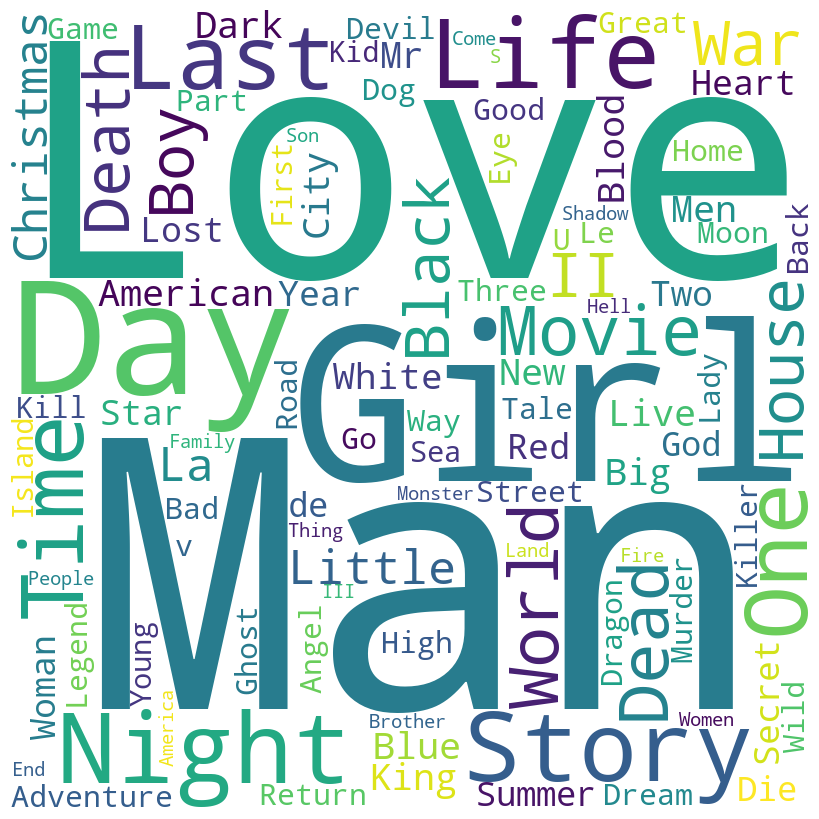

In [109]:
drop_duplicate_titles = mv.drop_duplicates("Título")
# Concatenate movie titles into a single string
text = ' '.join(drop_duplicate_titles['Título'].values)

# Create a WordCloud object
wordcloud = WordCloud(width=800, height=800, background_color='white', max_words=100, collocations=False)
# Generate the word cloud
wordcloud.generate(text)

# Display the word cloud
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Con un mapa de palabras vemos en la columna Títulos cuales son las mas frecuentes

In [90]:
# Se busca una correlación entre los valores númericos del datasets
hm= mv[['Presupuesto', 'Ingresos','Duración', 'Valoración', 'Retorno_Inversión', 'Popularidad']].corr()
hm

,Presupuesto,Ingresos,Duración,Valoración,Retorno_Inversión,Popularidad
Presupuesto,1.000000,0.768811,0.134710,0.073167,-0.002137,0.449604
Ingresos,0.768811,1.000000,0.103972,0.083815,0.000791,0.506200
Duración,0.134710,0.103972,1.000000,0.156778,0.000892,0.129648
Valoración,0.073167,0.083815,0.156778,1.000000,0.005591,0.153731
Retorno_Inversión,-0.002137,0.000791,0.000892,0.005591,1.000000,0.003215
Popularidad,0.449604,0.506200,0.129648,0.153731,0.003215,1.000000


<Axes: >

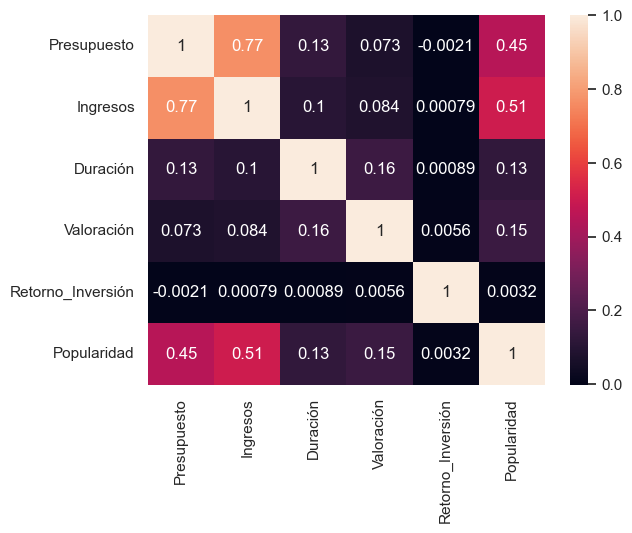

In [91]:
# Graficamos las correlaciones con el mapa de correlaciones de Seaborn
sns.heatmap(hm, annot=True)

mv

## Paso 4: Analizar Conjuntos de Datos
        
        

In [92]:
mv.head()

,Unnamed: 0,Presupuesto,id,original_language,Overview,Popularidad,Fecha_Estreno,Ingresos,Duración,Estatus,tagline,Título,Valoración,Año,Retorno_Inversión,collection,genres_name,production_companies,production_countries,spoken_languages_name
0,0,30000000,862,en,"Led by Woody, Andy's toys live happily in his ...",21.946943,1995-10-30,373554033.0,81.0,Released,NaN,Toy Story,7.7,1995,12.451801,Toy Story Collection,"['Animation', 'Comedy', 'Family']",['Pixar Animation Studios'],['United States of America'],['English']
1,1,65000000,8844,en,When siblings Judy and Peter discover an encha...,17.015539,1995-12-15,262797249.0,104.0,Released,Roll the dice and unleash the excitement!,Jumanji,6.9,1995,4.043035,NaN,"['Adventure', 'Fantasy', 'Family']","['TriStar Pictures', 'Teitler Film', 'Intersco...",['United States of America'],"['English', 'Français']"
2,2,0,15602,en,A family wedding reignites the ancient feud be...,11.712900,1995-12-22,0.0,101.0,Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,6.5,1995,0.000000,Grumpy Old Men Collection,"['Romance', 'Comedy']","['Warner Bros.', 'Lancaster Gate']",['United States of America'],['English']
3,3,16000000,31357,en,"Cheated on, mistreated and stepped on, the wom...",3.859495,1995-12-22,81452156.0,127.0,Released,Friends are the people who let you be yourself...,Waiting to Exhale,6.1,1995,5.090760,NaN,"['Comedy', 'Drama', 'Romance']",['Twentieth Century Fox Film Corporation'],['United States of America'],['English']
4,4,0,11862,en,Just when George Banks has recovered from his ...,8.387519,1995-02-10,76578911.0,106.0,Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,5.7,1995,0.000000,Father of the Bride Collection,['Comedy'],"['Sandollar Productions', 'Touchstone Pictures']",['United States of America'],['English']


In [93]:
# Ordenar el DataFrame por popularidad en orden descendente y seleccionar las 10 películas más populares
top_10_popular_movies = mv.sort_values('Popularidad', ascending=False).head(10)

# Crear la figura del gráfico de barras
fig = go.Figure(data=go.Bar(x=top_10_popular_movies['Título'],
                           y=top_10_popular_movies['Popularidad']))

# Personalizar el diseño del gráfico
fig.update_layout(title='Top 10 Películas más Populares',
                  xaxis_title='Películas',
                  yaxis_title='Popularidad unidades en miles')

# Mostrar el gráfico
fig.show()

Este gráfico de barras visualiza de manera clara las 10 películas más populares, con el eje x mostrando los títulos de las películas y el eje y representando la popularidad en unidades de miles.

In [94]:
# Obtener el año de la fecha de estreno
mv['Año_Estreno'] = pd.to_datetime(mv['Fecha_Estreno']).dt.year

# Contar la cantidad de películas por año
estrenos_por_año = mv['Año_Estreno'].value_counts().reset_index()
estrenos_por_año.columns = ['Año', 'Cantidad']

# Ordenar los años en orden ascendente
estrenos_por_año = estrenos_por_año.sort_values('Año')

# Crear el gráfico de barras
fig = px.bar(estrenos_por_año, x='Año', y='Cantidad')

# Personalizar el diseño del gráfico
fig.update_layout(title='Estrenos de Películas por Año',
                  xaxis_title='Año',
                  yaxis_title='Cantidad de Estrenos')

# Mostrar el gráfico
fig.show()

En este grafíco podemos observar que a lo largo de los años fue creciendo la cantidad de estrenos de peliculas por año teniendo como masividad de estrenos en el peiordo del año 2000 a la actualidad.

In [95]:

# Obtener la lista de países de la columna "production_countries"
countries = []
for row in mv['production_countries']:
    countries.extend(eval(row))

# Contar la cantidad de películas por país
paises_estrenos = pd.Series(countries).value_counts().nlargest(20).reset_index()
paises_estrenos.columns = ['País', 'Cantidad']

# Crear el gráfico de barras
fig = px.bar(paises_estrenos, x='País', y='Cantidad')

# Personalizar el diseño del gráfico
fig.update_layout(title='Países con más Estrenos de Películas',
                  xaxis_title='País',
                  yaxis_title='Cantidad de Estrenos')

# Rotar las etiquetas del eje x para una mejor legibilidad
fig.update_xaxes(tickangle=45)

# Mostrar el gráfico
fig.show()

Estos son los 20 paises con mas estrenos teniendo a EEUU como lider en el mercado actualmente.

In [96]:
# Agrupar los ingresos por año
df_tendencia = mv.groupby('Año')['Ingresos'].sum().reset_index()

# Crear el gráfico de tendencia
fig = px.line(df_tendencia, x='Año', y='Ingresos')

# Mostrar el gráfico
fig.show()


Aqui vemos como los ingresos de las productoras tienen un creciemiento similar al la cantidad de estrenos a los largo de los años teniendo correlación, más estrenos años de mas ingresos en el mercado del cine.

In [97]:
# Obtener los 5 idiomas más usados
top_5_idiomas = mv['original_language'].value_counts().head(4)

# Crear el gráfico de dona
fig = px.pie(names=top_5_idiomas.index, values=top_5_idiomas.values)

# Configurar el diseño del gráfico
fig.update_traces(hole=0.4, textinfo='percent+label')

# Mostrar el gráfico
fig.show()





En este grafico tomamos de referencia los 4 idiomas con mas peliculas en su idioma original esto nos lleva  a la conclusion que EEUU en su idioma original tiene mas estrenos que los demas paises liderando como se ha dicho anteriormente.

In [98]:
# Crear el gráfico de dispersión
fig = px.scatter(mv, x="Presupuesto", y="Ingresos", title="Relación entre Presupuesto e Ingresos")

# Mostrar el gráfico
fig.show()

En este ultimo podemos observar la relación de ingresos con el presupuesto de cada pelicula, llegando a la conclusion que hay una mayor densidad en la muestras de 50M y 150M en promedio de peliculas con dichos presupuestos e ingresos similares.

## Por ultimo hacemos uso de la libreria ProfileReport para ayudarnos con un poco de analisís express y tener otra perspectiva del EDA.

In [111]:
profile = ProfileReport(mv)
profile.to_notebook_iframe()


Render HTML: 100%|██████████| 1/1 [00:05<00:00,  5.81s/it]
